# Hypothesis #1

#### H0: Working for a Fortune 500 company has no impact on your visa application certification.

#### HA: Working for a Fortune 500 company has an impact on your visa application certification.

### Methodology

- Chi-squared test for homogeneity

- Target variable = Certification (categorical)

- Independent variable = Fortune 500 status (categorical)

- Levels = Fortune 500, Non- Fortune 500
   
- Alpha = .01


In [1]:
# Importing primary libraries
import pandas as pd
import numpy as np
import statsmodels as st
import re

In [2]:
# Importing webscraping libraries. 
!pip install selenium
from selenium import webdriver
import time

In [1]:
# Installing tech manipulating library.
#!pip install fuzzywuzzy
#!pip install python-Levenshtein

In [15]:
from fuzzywuzzy import fuzz 
from fuzzywuzzy import process

In [2]:
# Installing extension to 
#!pip install ipywidgets 
#!jupyter nbextension enable --py widgetsnbextension

In [3]:
# %%capture
# from tqdm import tqdm_notebook as tqdm
# tqdm().pandas()

In [2]:
import scipy.stats as stats
from scipy.stats import chi2_contingency
from scipy.stats import chi2
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
# Instantiating URL for webscraping. 
url = 'http://fortune.com/fortune500/2017/list/'

In [62]:
# Initial webscraping test. 
## DON'T RE-RUN!

chromedriver_path = "./chromedriver"
driver = webdriver.Chrome(executable_path=chromedriver_path)
driver.get(url)

pause = 3

last_height = driver.execute_script("return document.body.scrollHeight")


while True:
    # Scroll down to bottom
    driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")

    # Wait to load page
    time.sleep(pause)

    # Calculate new scroll height and compare with last scroll height
    new_height = driver.execute_script("return document.body.scrollHeight")
    if new_height == last_height:
        f500_test = driver.page_source
        break
    last_height = new_height

'<html><head><script type="text/javascript" async="" src="//cdn.tinypass.com/api/tinypass.min.js"></script><script type="text/javascript" async="" src="https://experience.tinypass.com/xbuilder/experience/load?aid=cfQj2fM3zj"></script><script type="text/javascript" async="" src="http://b.scorecardresearch.com/c2/6035728/cs.js"></script><script type="text/javascript" src="https://cdn.krxd.net/userdata/get?pub=1b008fc9-b074-4b2e-8e4a-c1e1f07d344b&amp;kxfp=9b77ec60370bd8919353f04cf057abf63bcfb4af&amp;technographics=1&amp;callback=Krux.ns.meredith.kxjsonp_userdata"></script><script type="text/javascript" src="https://beacon.krxd.net/optout_check?callback=Krux.ns.meredith.kxjsonp_optOutCheck"></script><script src="http://www.googletagservices.com/activeview/js/current/osd.js?cb=%2Fr20100101"></script><script src="http://static.parsely.com/code/ptrack-v1.3.0-engagedtime-slots-video.js"></script><script src="https://securepubads.g.doubleclick.net/gpt/pubads_impl_rendering_2019053001.js"></scri
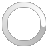

In [66]:
## DON'T RE-RUN!
f500_test

In [208]:
# Extracting specific Fortune 500 name data with RegEx. 
## DON'T RE-RUN!
f500Reg = re.compile(r'(list-item-)(\S+( )?\S+( )?\S+)(\.)(\d)')
f500 = f500Reg.findall(f500_test)

In [145]:
# Cleaning extracted data. 
## DON'T RE-RUN!
f500_2017 = []
for i in f500:
    if i[1].endswith('.0'):
        pass
    elif i[1] not in f500_2017:
        f500_2017.append(i[1])
    else:
        pass

f500_2017
        
        

list

In [5]:
# Turning the test into a function. 
def fortune_500(url):
    # Takes a URL from Fortune.com and spits out a list of Fortune 500 companies.
    # Initialize Chromedriver
    chromedriver_path = "./chromedriver"
    driver = webdriver.Chrome(executable_path=chromedriver_path)
    driver.get(url)
    
    # Delay before next initiation. 
    pause = 3
    
    # Defines current height.
    last_height = driver.execute_script("return document.body.scrollHeight")

    # While loop to scroll the page.
    while True:
        # Scroll down to bottom
        driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")

        # Waits for the page to load
        time.sleep(pause)

        # Calculate new scroll height and compare with last scroll height
        new_height = driver.execute_script("return document.body.scrollHeight")
        if new_height == last_height:
            # Captures the current state of the page as a string. 
            page = driver.page_source
            break
        last_height = new_height
    
    # Extract the company list as a list of tuples. 
    f500Reg = re.compile(r'(list-item-)(\S+( )?\S+( )?\S+)(\.)(\d)')
    f500 = f500Reg.findall(page)
    
    # Cleans extracted list and returns a new list.
    f500_list = []
    for i in f500:
        if i[1].endswith('.0'):
            pass
        elif i[1] not in f500_list:
            f500_list.append(i[1])
        else:
            pass
    return f500_list

In [149]:
## DON'T RE-RUN!
f500_2016 = fortune_500('http://fortune.com/fortune500/2016/list/')

In [179]:
## DON'T RE-RUN!
f500_2016

['Walmart',
 'Apple',
 'McKesson',
 'AT&amp;T',
 'AmerisourceBergen',
 'Verizon',
 'Chevron',
 'Costco',
 'Kroger',
 'Amazon=1com',
 'HP',
 'Boeing',
 'Microsoft',
 'Citigroup',
 'IBM',
 'Anthem',
 'Alphabet',
 'Comcast',
 'Target',
 'MetLife',
 'PepsiCo',
 'Aetna',
 'Lowe’s',
 'UPS',
 'AIG',
 'Intel',
 'Humana',
 'Disney',
 'Pfizer',
 'Sysco',
 'FedEx',
 'Caterpillar',
 'Coca-Cola',
 'Nationwide',
 'Merck',
 'Oracle',
 'Cigna',
 'Allstate',
 'TIAA',
 'CHS',
 'TJX',
 'ConocoPhillips',
 'Nike',
 '3M',
 'Exelon',
 'Deere',
 'Tesoro',
 'DuPont',
 'Avnet',
 'Macy’s',
 'McDonald’s',
 'Qualcomm',
 'EMC',
 'USAA',
 'Halliburton',
 'Raytheon',
 'AbbVie',
 'Centene',
 'Arconic',
 'Amgen',
 'Staples',
 'Danaher',
 'Whirlpool',
 'Aflac',
 'AutoNation',
 'Progressive',
 'ManpowerGroup',
 'Kohl’s',
 'Starbucks',
 'Paccar',
 'Cummins',
 'Xerox',
 'Kimberly-Clark',
 'Lear',
 'Fluor',
 'AECOM',
 'Facebook',
 'CenturyLink',
 'Supervalu',
 'Southern',
 'Nucor',
 'Colgate-Palmolive',
 'Freeport-McMoRan',

In [151]:
## DON'T RE-RUN!
f500_2015 = fortune_500('http://fortune.com/fortune500/2015/list/')

In [152]:
## DON'T RE-RUN!
f500_2015

['Walmart',
 'Chevron',
 'Apple',
 'McKesson',
 'AT&amp;T',
 'Verizon',
 'AmerisourceBergen',
 'Costco',
 'HP',
 'Kroger',
 'IBM',
 'Boeing',
 'Citigroup',
 'Amazon=1com',
 'Microsoft',
 'Walgreens',
 'Target',
 'Anthem',
 'MetLife',
 'Alphabet',
 'Comcast',
 'PepsiCo',
 'AIG',
 'UPS',
 'Aetna',
 'Lowe’s',
 'ConocoPhillips',
 'Intel',
 'Caterpillar',
 'Pfizer',
 'Humana',
 'Sysco',
 'Coca-Cola',
 'FedEx',
 'CHS',
 'Merck',
 'Tesoro',
 'Oracle',
 'Safeway',
 'Nationwide',
 'Deere',
 'DuPont',
 'Allstate',
 'Cigna',
 'TIAA-CREF',
 'DirecTV',
 'Halliburton',
 '3M',
 'TJX',
 'Macy’s',
 'Nike',
 'Avnet',
 'McDonald’s',
 'Exelon',
 'Qualcomm',
 'EMC',
 'USAA',
 'Alcoa',
 'Raytheon',
 'Aflac',
 'Staples',
 'Fluor',
 'Freeport-McMoRan',
 'Nucor',
 'Kimberly-Clark',
 'Hess',
 'Xerox',
 'ManpowerGroup',
 'Amgen',
 'AbbVie',
 'Danaher',
 'Whirlpool',
 'HollyFrontier',
 'Progressive',
 'Cummins',
 'AutoNation',
 'Kohl’s',
 'Paccar',
 'Southern',
 'Supervalu',
 'CenturyLink',
 'eBay',
 'Lear',
 'AE

In [169]:
# Webpages for 2012-2014 are differently formatted than 2015-2017. Adjusting the code and testing. 

## DON'T RE-RUN!
url_2 = 'http://fortune.com/fortune500/2014/'

chromedriver_path = "./chromedriver"
driver_2 = webdriver.Chrome(executable_path=chromedriver_path)
driver_2.get(url_2)
    
# Delay before next initiation. 
pause = 3
    
# Defines current height.
last_height = driver_2.execute_script("return document.body.scrollHeight")

# While loop to scroll the page.
while True:
    # Scroll down to bottom
    driver_2.execute_script("window.scrollTo(0, document.body.scrollHeight);")

    # Waits for the page to load
    time.sleep(pause)

    # Calculate new scroll height and compare with last scroll height
    new_height = driver_2.execute_script("return document.body.scrollHeight")
    if new_height == last_height:
        # Captures the current state of the page as a string. 
        page_2 = driver_2.page_source
        break
    last_height = new_height




'<html class=" js flexbox flexboxlegacy canvas canvastext webgl no-touch geolocation postmessage websqldatabase indexeddb hashchange history draganddrop websockets rgba hsla multiplebgs backgroundsize borderimage borderradius boxshadow textshadow opacity cssanimations csscolumns cssgradients cssreflections csstransforms csstransforms3d csstransitions fontface generatedcontent video audio localstorage sessionstorage webworkers no-applicationcache svg inlinesvg smil svgclippaths" lang="en"><!--<![endif]--><!--[if !(IE 6) | !(IE 7) | !(IE 8)  ]><!--><!--<![endif]--><head><script src="http://www.googletagservices.com/activeview/js/current/osd.js?cb=%2Fr20100101"></script><script src="https://securepubads.g.doubleclick.net/gpt/pubads_impl_rendering_2019053001.js"></script><script type="text/javascript" async="" src="//cdn.tinypass.com/api/tinypass.min.js"></script><script type="text/javascript" src="http://bam.nr-data.net/1/7fc7d5aa08?a=9746606&amp;sa=1&amp;pl=1559915341972&amp;v=632.2b1762
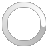

In [170]:
## DON'T RE-RUN!
page_2

In [223]:
# Adjusting RegEx to new layout. 

## DON'T RE-RUN!
f500oldReg = re.compile(r'("tile">)(\S+( )?\S+( )?\S+( )?\S+)(<)')
f500_old_test = f500oldReg.findall(page_2)

In [225]:
## DON'T RE-RUN!
f500_old_test

[('"tile">', 'Wal-Mart Stores', ' ', '', '', '<'),
 ('"tile">', 'Exxon Mobil', ' ', '', '', '<'),
 ('"tile">', 'Chevron', '', '', '', '<'),
 ('"tile">', 'Berkshire Hathaway', ' ', '', '', '<'),
 ('"tile">', 'Apple', '', '', '', '<'),
 ('"tile">', 'Phillips 66', '', ' ', '', '<'),
 ('"tile">', 'General Motors', ' ', '', '', '<'),
 ('"tile">', 'Ford Motor', ' ', '', '', '<'),
 ('"tile">', 'General Electric', ' ', '', '', '<'),
 ('"tile">', 'Valero Energy', ' ', '', '', '<'),
 ('"tile">', 'AT&amp;T', '', '', '', '<'),
 ('"tile">', 'CVS Caremark', ' ', '', '', '<'),
 ('"tile">', 'Fannie Mae', ' ', '', '', '<'),
 ('"tile">', 'UnitedHealth Group', ' ', '', '', '<'),
 ('"tile">', 'McKesson', '', '', '', '<'),
 ('"tile">', 'Verizon Communications', ' ', '', '', '<'),
 ('"tile">', 'Hewlett-Packard', '', '', '', '<'),
 ('"tile">', 'Costco Wholesale', ' ', '', '', '<'),
 ('"tile">', 'Express Scripts Holding', ' ', ' ', '', '<'),
 ('"tile">', 'Bank of America', ' ', ' ', '', '<'),
 ('"tile">', 'Ca

In [226]:
# Adjusting text extraction loop. 
## DON'T RE-RUN!
f500_2014 = []
for i in f500_old_test:
    if i[1] not in f500_2014:
        f500_2014.append(i[1])
    else:
        pass
f500_2014

['Wal-Mart Stores',
 'Exxon Mobil',
 'Chevron',
 'Berkshire Hathaway',
 'Apple',
 'Phillips 66',
 'General Motors',
 'Ford Motor',
 'General Electric',
 'Valero Energy',
 'AT&amp;T',
 'CVS Caremark',
 'Fannie Mae',
 'UnitedHealth Group',
 'McKesson',
 'Verizon Communications',
 'Hewlett-Packard',
 'Costco Wholesale',
 'Express Scripts Holding',
 'Bank of America',
 'Cardinal Health',
 'International Business Machines',
 'Kroger',
 'Marathon Petroleum',
 'Citigroup',
 'Archer Daniels Midland',
 'AmerisourceBergen',
 'Wells Fargo',
 'Boeing',
 'Procter &amp; Gamble',
 'Freddie Mac',
 'Home Depot',
 'Microsoft',
 'Amazon.com',
 'Target',
 'Walgreen Co.',
 'WellPoint',
 'Johnson &amp; Johnson',
 'American International Group',
 'State Farm Insurance Cos.',
 'MetLife',
 'PepsiCo',
 'Comcast',
 'United Technologies',
 'Google',
 'ConocoPhillips',
 'Dow Chemical',
 'Caterpillar',
 'United Parcel Service',
 'Pfizer',
 'Lowe’s Companies',
 'Intel Corporation',
 'Energy Transfer Equity, L.P.',
 

In [6]:
# Updating scraping function for older webpages. 

def f500_old(url):
    chromedriver_path = "./chromedriver"
    driver = webdriver.Chrome(executable_path=chromedriver_path)
    driver.get(url)
    
    # Delay before next initiation. 
    pause = 3
    
    # Defines current height.
    last_height = driver.execute_script("return document.body.scrollHeight")

    # While loop to scroll the page.
    while True:
        # Scroll down to bottom
        driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")

        # Waits for the page to load
        time.sleep(pause)

        # Calculate new scroll height and compare with last scroll height
        new_height = driver.execute_script("return document.body.scrollHeight")
        if new_height == last_height:
            # Captures the current state of the page as a string. 
            page = driver.page_source
            break
        last_height = new_height
    
    # Extract the company list as a list of tuples.
    f500Reg = re.compile(r'("tile">)(\S+( )?\S+( )?\S+( )?\S+)(<)')
    f500 = f500Reg.findall(page)
    # Cleans extracted list and returns a new list.    
    f500_list = []
    for i in f500:
        if i[1] not in f500_list:
            f500_list.append(i[1])
    else:
        pass
    return f500_list

In [235]:
## DON'T RE-RUN!
f500_2013 = f500_old('http://fortune.com/fortune500/2013/')

In [238]:
## DON'T RE-RUN!
f500_2012 = f500_old('http://fortune.com/fortune500/2012/')

In [7]:
# Concatenating the produced lists. 
def joiner(old_lst, new_lst):
    comb = old_lst
    for i in new_lst:
        if i not in comb:
            comb.append(i)
    order = set(comb)
    return list(order)

In [251]:
## DON'T RE-RUN!
f500_12_13 = joiner(f500_2012, f500_2013)

In [254]:
## DON'T RE-RUN!
f500_12_13_14 = joiner(f500_12_13,f500_2014)

In [256]:
## DON'T RE-RUN!
f500_12_15 = joiner(f500_12_13_14,f500_2015)

In [258]:
## DON'T RE-RUN!
f500_12_16 = joiner(f500_12_15,f500_2016)

In [259]:
## DON'T RE-RUN!
f500_all = joiner(f500_12_16,f500_2017)

In [265]:
## DON'T RE-RUN!
f500_all

['CIT Group Inc.',
 'General Electric',
 'Parker-Hannifin',
 'KeyCorp',
 'AmTrust Financial Services, Inc.',
 'Dover',
 'Hanesbrands',
 'Casey’s General Stores, Inc.',
 'Fluor',
 'Dollar General Corporation',
 'Avon Products, Inc.',
 'Essendant',
 'Ralcorp Holdings, Inc.',
 'Brink’s',
 'CDW',
 'TrueBlue',
 'Jones Lang LaSalle Incorporated',
 'Caesars Entertainment Corporation',
 'The Timken Company',
 'Google',
 'Honeywell International Inc.',
 'Vishay Intertechnology, Inc.',
 'Anadarko Petroleum Corporation',
 'Rent-A-Center',
 'Buckeye Partners, L.P.',
 'Gardner Denver, Inc.',
 'Wisconsin Energy Corporation',
 'Kindred Healthcare, Inc.',
 'Alpha Natural Resources, Inc.',
 'Curtiss-Wright Corporation',
 'TreeHouse Foods, Inc.',
 'Quintiles Transnational Holdings Inc.',
 'Tenneco',
 'Trimble',
 'Oshkosh Corporation',
 'Waste Management, Inc.',
 'SunTrust Banks, Inc.',
 'Harman International Industries, Incorporated',
 'Lowe’s Companies, Inc.',
 'Colfax Corporation',
 'Citigroup Inc.',


In [269]:
# Notebook kernel needed restarting. Didn't want to run everything again. 
%store f500_all

Stored 'f500_all' (list)


In [4]:
# Restoring saved lists. 
%store -r f500_all
f500_all

['CIT Group Inc.',
 'General Electric',
 'Parker-Hannifin',
 'KeyCorp',
 'AmTrust Financial Services, Inc.',
 'Dover',
 'Hanesbrands',
 'Casey’s General Stores, Inc.',
 'Fluor',
 'Dollar General Corporation',
 'Avon Products, Inc.',
 'Essendant',
 'Ralcorp Holdings, Inc.',
 'Brink’s',
 'CDW',
 'TrueBlue',
 'Jones Lang LaSalle Incorporated',
 'Caesars Entertainment Corporation',
 'The Timken Company',
 'Google',
 'Honeywell International Inc.',
 'Vishay Intertechnology, Inc.',
 'Anadarko Petroleum Corporation',
 'Rent-A-Center',
 'Buckeye Partners, L.P.',
 'Gardner Denver, Inc.',
 'Wisconsin Energy Corporation',
 'Kindred Healthcare, Inc.',
 'Alpha Natural Resources, Inc.',
 'Curtiss-Wright Corporation',
 'TreeHouse Foods, Inc.',
 'Quintiles Transnational Holdings Inc.',
 'Tenneco',
 'Trimble',
 'Oshkosh Corporation',
 'Waste Management, Inc.',
 'SunTrust Banks, Inc.',
 'Harman International Industries, Incorporated',
 'Lowe’s Companies, Inc.',
 'Colfax Corporation',
 'Citigroup Inc.',


In [9]:
len(f500_all)

1374

In [5]:
# Creating DF of F500 names for storing, just in case. 
df_f500 = pd.DataFrame(f500_all, columns=["f500_name"])
df_f500.to_csv('f500.csv', index=False)
df_f500.head()

,f500_name
0,CIT Group Inc.
1,General Electric
2,Parker-Hannifin
3,KeyCorp
4,"AmTrust Financial Services, Inc."


In [6]:
# Importing clean csv. 
df = pd.read_csv('visa_clean.csv')
df.columns

/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3020: DtypeWarning: Columns (1,2,10,11,12,13,17,18,21,22,23,24,25,26,28,29,30) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Index(['Unnamed: 0', 'application_type', 'case_received_date', 'case_status',
       'class_of_admission', 'decision_date', 'employer_city', 'employer_name',
       'employer_num_employees', 'employer_state', 'foreign_worker_info_city',
       'foreign_worker_info_education', 'foreign_worker_info_state',
       'pw_amount_9089', 'pw_level_9089', 'pw_soc_code', 'pw_soc_title',
       'refile', 'us_economic_sector', 'citizenship', 'case_num',
       'foreign_work_alt_edu', 'foreign_worker_birth_country',
       'foreign_worker_edu_other', 'foreign_worker_rel_occ_exp',
       'foreign_worker_req_exp', 'naics_num', 'naics_title', 'wage_offer_from',
       'wage_offer_to', 'wage_unit_of_pay_offer', 'pw_job_title'],
      dtype='object')

In [7]:
# Removing garbage column. 
df.drop('Unnamed: 0', axis=1, inplace=True)

In [115]:
df.head()

,application_type,case_received_date,case_status,class_of_admission,decision_date,employer_city,employer_name,employer_num_employees,employer_state,foreign_worker_info_city,...,foreign_worker_birth_country,foreign_worker_edu_other,foreign_worker_rel_occ_exp,foreign_worker_req_exp,naics_num,naics_title,wage_offer_from,wage_offer_to,wage_unit_of_pay_offer,pw_job_title
0,PERM,NaN,Certified,J-1,2012-02-01,NEW YORK,NETSOFT USA INC.,NaN,NY,NaN,...,NaN,NaN,NaN,NaN,541512,COMPUTER SYSTEMS DESIGN SERVICES,75629,NaN,Year,"COMPUTER SOFTWARE ENGINEERS, APPLICATIONS"
1,PERM,NaN,Denied,B-2,2011-12-21,CARLSTADT,PINNACLE ENVIRONEMNTAL CORP,NaN,NY,NaN,...,NaN,NaN,NaN,NaN,562211,HAZARDOUS WASTE TREATMENT AND DISPOSAL,37024,NaN,Year,ASBESTOS HANDLER
2,PERM,NaN,Certified,H-1B,2011-12-01,GLEN ALLEN,"SCHNABEL ENGINEERING, INC.",NaN,VA,NaN,...,NaN,NaN,NaN,NaN,541330,ENGINEERING SERVICES,47923,NaN,Year,CIVIL ENGINEER
3,PERM,NaN,Certified,B-2,2011-12-01,FLUSHING,EBENEZER MISSION CHURCH,NaN,NY,NaN,...,NaN,NaN,NaN,NaN,813110,RELIGIOUS ORGANIZATIONS,10.97,NaN,Hour,FILE CLERK
4,PERM,NaN,Certified,L-1,2012-01-26,ALBANY,ALBANY INTERNATIONAL CORP.,NaN,NY,NaN,...,NaN,NaN,NaN,NaN,333291,PAPER INDUSTRY MACHINERY MANUFACTURING,100000,NaN,Year,SALES & SERVICE ENGINEER


In [8]:
# Creating a sampled df in order to speed up processing. 
sample = int(0.30*len(df))
sample_df = df.sample(sample)
sample_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112308 entries, 105105 to 66635
Data columns (total 31 columns):
application_type                 40530 non-null object
case_received_date               71777 non-null object
case_status                      112308 non-null object
class_of_admission               105466 non-null object
decision_date                    112308 non-null object
employer_city                    112303 non-null object
employer_name                    112304 non-null object
employer_num_employees           71752 non-null float64
employer_state                   112296 non-null object
foreign_worker_info_city         71768 non-null object
foreign_worker_info_education    71766 non-null object
foreign_worker_info_state        66649 non-null object
pw_amount_9089                   111627 non-null object
pw_level_9089                    103992 non-null object
pw_soc_code                      112186 non-null object
pw_soc_title                     111584 non-null o

In [143]:
# Instatiate a new column in the sample dataframe for Fortune 500 companies. 
# It will be a binary: 0 not a F500, 1 if it is.
# Filling all values with 0 to start. 
sample_df['f500'] = 0

# Creating a list of zeroes and ones as loop iterates. 
f_500 = []
for company in tqdm(sample_df['employer_name']):
    if type(company) != str: # Checking base case. 
        f_500.append(0)
        pass
    else:
        match = process.extractOne(company, f500_all) #Returns tuple of best match and percent fit.
        if match[1] >= 95:
            f_500.append(1)
        else:
            f_500.append(0)

In [144]:
# Appending to the dataframe.
sample_df['f500'] = f_500
sample_df.head(50)

,application_type,case_received_date,case_status,class_of_admission,decision_date,employer_city,employer_name,employer_num_employees,employer_state,foreign_worker_info_city,...,foreign_worker_edu_other,foreign_worker_rel_occ_exp,foreign_worker_req_exp,naics_num,naics_title,wage_offer_from,wage_offer_to,wage_unit_of_pay_offer,pw_job_title,f500
153449,NaN,2014-05-29,Certified-Expired,H-1B,2014-10-17,BOSTON,AQUENT LLC,2700.0,MASSACHUSETTS,GLEN ELLYN,...,NaN,Y,A,541512,COMPUTER SYSTEMS DESIGN SERVICES,"76,211.00","110,000.00",Year,"SOFTWARE DEVELOPERS, APPLICATIONS",0
229305,NaN,2015-04-08,Certified-Expired,H-1B,2015-10-21,SAN FRANCISCO,"VIDA HEALTH, INC.",55.0,CA,FREEMONT,...,None,Y,N,541512.0,COMPUTER SYSTEMS DESIGN SERVICES,175000.0,NaN,Year,PRODUCT DESIGN LEAD,0
138652,NaN,2013-07-25,Certified-Expired,H-1B,2015-03-03,SAN DIEGO,QUALCOMM TECHNOLOGIES INC.,26600.0,CALIFORNIA,SAN DIEGO,...,NaN,Y,A,334220,RADIO AND TELEVISION BROADCASTING AND WIRELESS...,"121,763.20","147,100.00",Year,"SOFTWARE DEVELOPERS, SYSTEMS SOFTWARE",0
156702,NaN,2014-09-09,Certified-Expired,H-1B,2015-01-30,ROCKVILLE,"INTELLIGENT AUTOMATION, INC.",142.0,MARYLAND,GERMANTOWN,...,NaN,Y,A,541710.0,"RESEARCH AND DEVELOPMENT IN THE PHYSICAL, ENGI...","90,688.00",NaN,Year,ELECTRONIC ENGINEERS. EXCEPT COMPUTER,0
184371,NaN,2015-03-13,Certified,H-1B,2015-09-23,SIGOURNEY,KEOKUK COUNTY HEALTH CENTER,106.0,IOWA,SIGOURNEY,...,NaN,N,Y,622110,GENERAL MEDICAL AND SURGICAL HOSPITALS,"50,419.00",NaN,Year,MEDICAL TECHNOLOGIST,0
240650,NaN,2014-09-05,Certified-Expired,B-2,2015-12-03,FLUSHING,HAN NAM CHAIN CORP.,50.0,NY,FLUSHING,...,None,A,A,445110,SUPERMARKETS AND OTHER GROCERY (EXCEPT CONVENI...,19032,NaN,Year,CASHIERS,0
174753,NaN,2014-10-04,Denied,H-1B,2015-02-19,ATLANTA,ALTISOURCE,1700.0,GEORGIA,DALLAS,...,NaN,Y,N,531390,OTHER ACTIVITIES RELATED TO REAL ESTATE,"105,560.00",NaN,Year,"SOFTWARE DEVELOPERS, APPLICATIONS",0
148012,NaN,2014-04-21,Certified,H-1B,2015-07-24,PALO ALTO,"A9.COM, INC.",271.0,CALIFORNIA,SAN JOSE,...,NaN,Y,A,541519.0,OTHER COMPUTER RELATED SERVICES,"125,000.00",NaN,Year,"SOFTWARE DEVELOPERS, APPLICATIONS",0
307139,NaN,2016-02-26,Certified,NaN,2016-06-08,MIAMI,"MOSAICIST, INC.",3.0,FL,DELEG. MAGDALENA CONTRERAS,...,None,A,Y,238340.0,TILE AND TERRAZZO CONTRACTORS,29890,NaN,Year,TILE AND MARBLE SETTERS,0
205621,NaN,2014-12-24,Certified,H-1B,2015-07-22,ALLENTOWN,SOFTNICE INC.,59.0,PENNSYLVANIA,EDISON,...,NaN,A,A,541511,CUSTOM COMPUTER PROGRAMMING SERVICES,"70,000.00",NaN,Year,NETWORK AND COMPUTER SYSTEMS ADMINISTRATORS,0


In [149]:
# Splitting into Fortune 500 and non-Fortune 500. 
df_f500 = sample_df.loc[sample_df['f500'] == 1]
df_nonf500 = sample_df.loc[sample_df['f500'] == 0]

In [160]:
df_f500.columns

Index(['application_type', 'case_received_date', 'case_status',
       'class_of_admission', 'decision_date', 'employer_city', 'employer_name',
       'employer_num_employees', 'employer_state', 'foreign_worker_info_city',
       'foreign_worker_info_education', 'foreign_worker_info_state',
       'pw_amount_9089', 'pw_level_9089', 'pw_soc_code', 'pw_soc_title',
       'refile', 'us_economic_sector', 'citizenship', 'case_num',
       'foreign_work_alt_edu', 'foreign_worker_birth_country',
       'foreign_worker_edu_other', 'foreign_worker_rel_occ_exp',
       'foreign_worker_req_exp', 'naics_num', 'naics_title', 'wage_offer_from',
       'wage_offer_to', 'wage_unit_of_pay_offer', 'pw_job_title', 'f500'],
      dtype='object')

In [151]:
# Splitting again into certified and denied for both levels. 
f500_cert = df_f500.loc[df_f500['case_status'] == 'Certified'].count() + df_f500.loc[df_f500['case_status'] == 'Certified-Expired'].count()
nonf500_cert = df_nonf500.loc[df_nonf500['case_status'] == 'Certified'].count() + df_nonf500.loc[df_nonf500['case_status'] == 'Certified-Expired'].count()
f500_den = df_f500.loc[df_f500['case_status'] == 'Denied'].count() + df_f500.loc[df_f500['case_status'] == 'Withdrawn'].count()
nonf500_den = df_nonf500.loc[df_nonf500['case_status'] == 'Denied'].count() + df_nonf500.loc[df_nonf500['case_status'] == 'Withdrawn'].count()

In [166]:
f500_den

application_type                  545
case_received_date                530
case_status                      1075
class_of_admission               1067
decision_date                    1075
employer_city                    1075
employer_name                    1075
employer_num_employees            530
employer_state                   1075
foreign_worker_info_city          530
foreign_worker_info_education     530
foreign_worker_info_state         526
pw_amount_9089                   1032
pw_level_9089                     860
pw_soc_code                      1074
pw_soc_title                     1033
refile                            435
us_economic_sector                480
citizenship                      1074
case_num                         1075
foreign_work_alt_edu              530
foreign_worker_birth_country      529
foreign_worker_edu_other          237
foreign_worker_rel_occ_exp        530
foreign_worker_req_exp            530
naics_num                        1073
naics_title 

In [152]:
# Creating np.arry for testing. 
certified = [f500_cert['case_status'], nonf500_cert['case_status']]
denied = [f500_den['case_status'],nonf500_den['case_status']]
f500_chi2 = np.array([certified,denied])
f500_chi2

array([[17897, 81222],
       [ 1075, 12114]])

In [155]:
# Running chi-squared. 
chi2_stat, p_val, dof, ex = chi2_contingency(f500_chi2)
print("===Chi2 Stat===")
print(chi2_stat)
print("\n")
print("===Degrees of Freedom===")
print(dof)
print("\n")
print("===P-Value===")
print(p_val)
print("\n")
print("===Contingency Table===")
print(ex)

#interpret test-statistics
prob = .99
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, chi2_stat))
if abs(chi2_stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
    
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p_val))
if p_val <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

===Chi2 Stat===
812.7919702450812


===Degrees of Freedom===
1


===P-Value===
8.93066630478627e-179


===Contingency Table===
[[16744.00459451 82374.99540549]
 [ 2227.99540549 10961.00459451]]
probability=0.990, critical=6.635, stat=812.792
Dependent (reject H0)
significance=0.010, p=0.000
Dependent (reject H0)


### Results:

- Chi squared stat is large.
- P-value is tiny/close to zero.
- We can reject the null hypothesis. 

In [164]:
def visualize_chisq(chisq_stat, df, alpha):
    # initialize a matplotlib "figure"
    fig = plt.figure(figsize=(16,10))
    # get the current "axis" out of the figure
    ax = fig.gca()

    xs = np.linspace(0, 850, 50)
    ys = stats.chi2.pdf(xs, df)
    ax.plot(xs, ys, 'r-', lw=5, alpha=alpha, label='chi2 pdf')
    # plot the lines using matplotlib's plot function:
    ax.plot(xs, ys, linewidth=2, color='darkblue')

    # plot a vertical line for our measured difference in rates t-statistic
    ax.axvline(chisq_stat, color='red', linestyle='--', lw=5,label='chi-sq-statistic')
    chi_sq_crit = stats.chi2.ppf(1-alpha, df)
    ax.plot(xs, ys, linewidth=1, color='darkblue')
    ax.axvline(chi_sq_crit,color='green',linestyle='--',lw=4,label='crit chi-sq-value')
    ax.fill_betweenx(ys,xs,chi_sq_crit, where= xs > chi_sq_crit)
    
    ax.legend()
    plt.show()
    return None

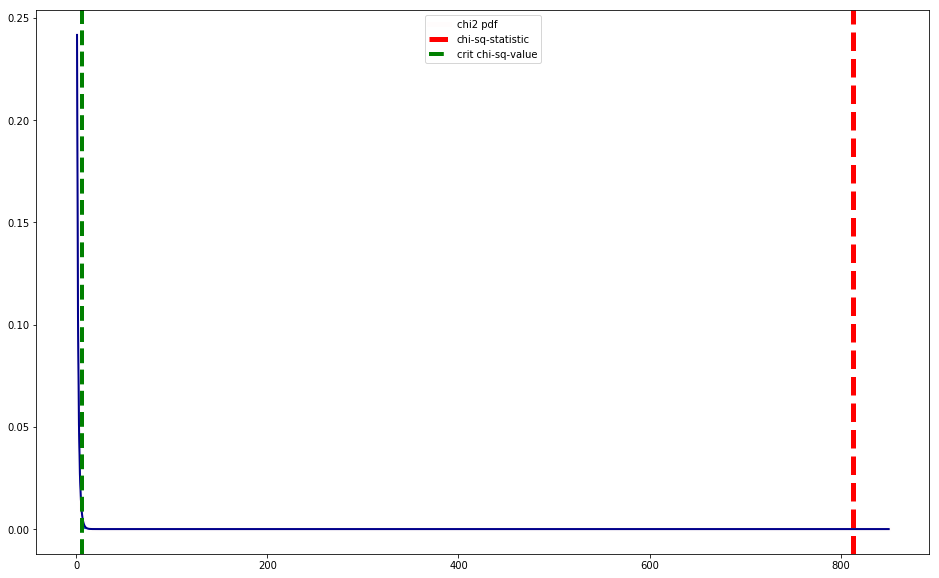

In [165]:
visualize_chisq(chi2_stat, dof, alpha)

## Further Exploration

- We speculate that the strongest feature may actually be class of admission. 
- We will work to visualize the raw approval values of our sample class. 

In [202]:
# Create a new dataframe with just class_of_admission and case_status for Fortune 500.
f500_parse = pd.DataFrame([df_f500.class_of_admission, df_f500.case_status]).transpose()
f500_parse.head()

,class_of_admission,case_status
14522,H-1B,Certified
360329,H-1B,Certified
60958,H-1B,Denied
309598,H-1B,Certified
99269,H-1B,Certified-Expired


In [203]:
# Create a new dataframe with just class_of_admission and case_status for non-Fortune 500.
nonf500_parse = pd.DataFrame([df_nonf500.class_of_admission, df_nonf500.case_status]).transpose()
nonf500_parse.head()

,class_of_admission,case_status
153449,H-1B,Certified-Expired
229305,H-1B,Certified-Expired
138652,H-1B,Certified-Expired
156702,H-1B,Certified-Expired
184371,H-1B,Certified


In [34]:
# Getting the total counts for each class of admission. 
coa = sample_df['class_of_admission'].value_counts()
coa

H-1B          84832
L-1            6040
F-1            4539
Not in USA     2603
TN             1306
E-2            1216
B-2             982
Parolee         802
EWI             578
J-1             313
F-2             265
E-3             261
H-4             236
O-1             225
B-1             203
L-2             168
E-1             163
H-1B1           159
H-2B            121
TPS              57
P-1              51
A1/A2            49
H-2A             44
G-4              40
R-1              34
I                25
G-5              22
J-2              22
VWT              18
H-1A             14
P-3              13
H-3              12
C-1              10
TD                7
M-1               6
A-3               5
O-2               3
P-4               3
O-3               3
Parol             2
Q                 2
H-1C              2
R-2               2
VWB               2
D-1               1
N                 1
K-1               1
G-1               1
C-3               1
AOS/H-1B          1


In [35]:
# Getting certification counts. 
s_cert = sample_df.loc[sample_df['case_status'] == 'Certified']
s_cert_e = sample_df.loc[sample_df['case_status'] == 'Certified-Expired']
s_cert_class = s_cert['class_of_admission'].value_counts()
s_cert_e_class = s_cert_e['class_of_admission'].value_counts()

In [36]:
total_cert = s_cert_class.add(s_cert_e_class)

In [37]:
s_cert_e_class


H-1B          35058
L-1            2684
F-1            1556
Not in USA      772
TN              500
E-2             411
Parolee         365
B-2             266
EWI             141
J-1              96
E-3              89
H-4              89
F-2              83
O-1              80
L-2              69
H-1B1            52
E-1              48
B-1              45
H-2B             27
P-1              19
TPS              19
A1/A2            17
G-4              13
R-1              13
I                11
H-1A              6
G-5               6
H-3               5
J-2               5
P-3               5
VWT               4
H-2A              3
Q                 2
TD                2
C-1               2
Parol             2
D-1               1
A-3               1
O-2               1
R-2               1
M-1               1
VWB               1
O-3               1
Name: class_of_admission, dtype: int64

In [47]:
# Returns approval percentage for each class. 
percent = total_cert /  coa

In [48]:
percent

A-3           0.400000
A1/A2         0.857143
AOS/H-1B           NaN
B-1           0.551724
B-2           0.680244
C-1           0.800000
C-3                NaN
D-1                NaN
E-1           0.803681
E-2           0.802632
E-3           0.896552
EWI           0.508651
F-1           0.836308
F-2           0.796226
G-1                NaN
G-4           0.850000
G-5           0.454545
H-1A          0.928571
H-1B          0.906333
H-1B1         0.748428
H-1C               NaN
H-2A          0.295455
H-2B          0.644628
H-3           1.000000
H-4           0.843220
I             0.960000
J-1           0.808307
J-2           0.863636
K-1                NaN
L-1           0.942881
L-2           0.910714
M-1           0.666667
N                  NaN
Not in USA    0.787553
O-1           0.875556
O-2           0.666667
O-3           1.000000
P-1           0.784314
P-3           0.769231
P-4                NaN
Parol              NaN
Parolee       0.857855
Q                  NaN
R-1        

In [49]:
# Cleaning NaN values.
percent_clean = percent.drop(labels=['AOS/H-1B','C-3','D-1','G-1','H-1C','K-1','N','P-4','Parol','Q','R-2'])                                  


In [50]:
type(percent_clean)

pandas.core.series.Series

In [51]:
# Sorting. 
percent_clean.sort_values(inplace=True, ascending=False)
percent_clean

O-3           1.000000
H-3           1.000000
VWB           1.000000
I             0.960000
L-1           0.942881
H-1A          0.928571
L-2           0.910714
TN            0.906585
H-1B          0.906333
E-3           0.896552
R-1           0.882353
O-1           0.875556
J-2           0.863636
Parolee       0.857855
A1/A2         0.857143
G-4           0.850000
H-4           0.843220
TPS           0.842105
F-1           0.836308
J-1           0.808307
E-1           0.803681
E-2           0.802632
C-1           0.800000
F-2           0.796226
Not in USA    0.787553
P-1           0.784314
P-3           0.769231
H-1B1         0.748428
TD            0.714286
B-2           0.680244
O-2           0.666667
M-1           0.666667
H-2B          0.644628
B-1           0.551724
EWI           0.508651
G-5           0.454545
VWT           0.444444
A-3           0.400000
H-2A          0.295455
Name: class_of_admission, dtype: float64

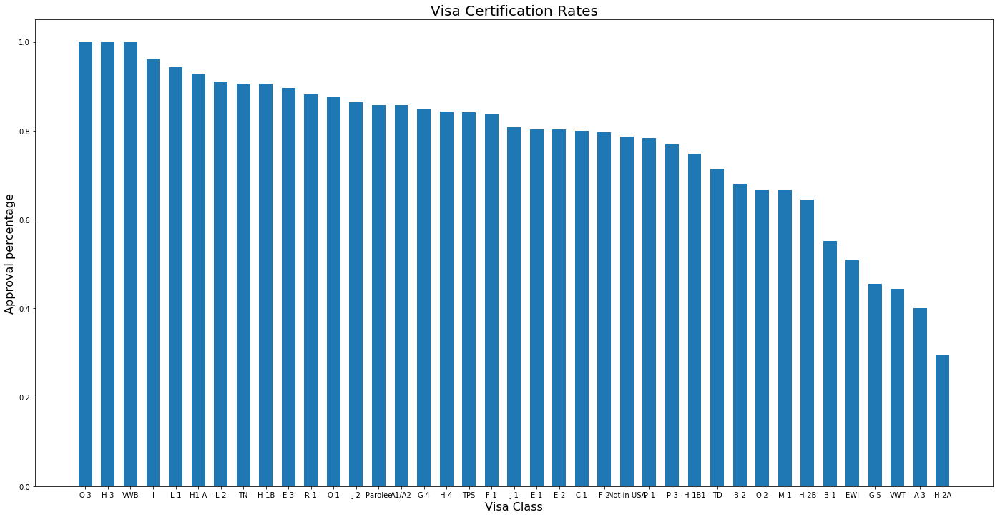

In [60]:
# Plotting approval percentages by class of admission.

names = ['O-3', 'H-3','VWB', 'I', 'L-1', 'H1-A','L-2', 'TN', 'H-1B', 'E-3', 'R-1', 'O-1','J-2','Parolee','A1/A2','G-4',
        'H-4', 'TPS', 'F-1','J-1','E-1','E-2','C-1','F-2','Not in USA','P-1','P-3','H-1B1','TD','B-2','O-2','M-1','H-2B',
        'B-1','EWI','G-5','VWT','A-3','H-2A']
values = percent_clean
x_lab = 'Visa Class'

plt.figure(figsize=(24, 12))

plt.bar(names, values, width=0.6)
plt.xticks(names)
plt.title('Visa Certification Rates',fontsize=20)
plt.xlabel(x_lab, fontsize=16)
plt.ylabel('Approval percentage',fontsize=16)
plt.show()